<a href="https://colab.research.google.com/github/Drecor1798/proyecto_final_ciencia_de_datos_parte_1/blob/main/Copia_de_Proyecto_final_parte_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Análisis de la Transcripción de la Serie "The Big Bang Theory"

Este proyecto tiene como objetivo explorar y analizar en profundidad la transcripción completa de la aclamada serie de televisión "The Big Bang Theory". Utilizando diversas técnicas de procesamiento del lenguaje natural (PLN) y análisis de datos, buscamos desentrañar patrones lingüísticos, características del diálogo y aspectos del sentimiento expresado por los personajes a lo largo de las temporadas.

A través de este análisis, investigaremos:

*   La frecuencia y el uso de palabras clave por parte de los personajes principales.
*   Las frases y combinaciones de palabras (N-gramas) más distintivas de cada personaje.
*   La evolución del sentimiento (positivo, negativo, neutral) en los diálogos, tanto a nivel general como para personajes específicos y a lo largo de las temporadas.
*   Posibles diferencias en el estilo lingüístico y el vocabulario entre los personajes.

Este estudio ofrece una perspectiva basada en datos sobre la construcción de los diálogos y la personalidad lingüística de los queridos personajes de "The Big Bang Theory", proporcionando una comprensión más rica de cómo el lenguaje contribuye al humor y al desarrollo de la serie.

In [ ]:
!pip install -q kaggle

In [ ]:
! gdown --id 1XL-U81WlWTjmc5ByZVd3l63wARxECvaL

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1XL-U81WlWTjmc5ByZVd3l63wARxECvaL
To: /content/kaggle.json
100% 66.0/66.0 [00:00<00:00, 348kB/s]


In [ ]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets list

ref                                                       title                                                     size  lastUpdated                 downloadCount  voteCount  usabilityRating  
--------------------------------------------------------  --------------------------------------------------  ----------  --------------------------  -------------  ---------  ---------------  
sahilislam007/college-student-placement-factors-dataset   College Student Placement Factors Dataset               110450  2025-07-02 08:33:50.547000           5648        115  1.0              
abdulmalik1518/cars-datasets-2025                         Cars Datasets (2025)                                     25987  2025-07-17 21:43:28.493000           2253         53  1.0              
urvishahir/electric-vehicle-specifications-dataset-2025   Electric Vehicle Specs Dataset (2025)🔋🚗                  16631  2025-06-20 07:14:56.777000           9959        243  1.0              
abhishekjaiswal4896/mental-hea

In [ ]:
!kaggle datasets download -d mitramir5/the-big-bang-theory-series-transcript

Dataset URL: https://www.kaggle.com/datasets/mitramir5/the-big-bang-theory-series-transcript
License(s): unknown
  0% 0.00/1.92M [00:00<?, ?B/s]
100% 1.92M/1.92M [00:00<00:00, 620MB/s]


In [ ]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from datetime import datetime
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score
from prophet import Prophet
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
# Data handling and preprocessing
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder

# Model selection and evaluation
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import train_test_split, HalvingGridSearchCV, RandomizedSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, mean_squared_error, mean_absolute_error, r2_score

# Classification models
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

# Regression models
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor

# Visualization
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

# Miscellaneous
import pickle
import os
import joblib

In [ ]:
import pandas as pd
import zipfile
import os

# Define the path to the downloaded zip file
zip_file_path = "the-big-bang-theory-series-transcript.zip"
extract_path = "the_big_bang_theory_transcripts"

# Extract the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

# Find the first CSV file in the extracted directory
csv_file_path = None
for root, _, files in os.walk(extract_path):
    for file in files:
        if file.endswith('.csv'):
            csv_file_path = os.path.join(root, file)
            break
    if csv_file_path:
        break

if csv_file_path:
    # Load the dataset using pandas
    df = pd.read_csv(csv_file_path)
    df.info()
else:
    print("No CSV file found in the extracted directory.")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54406 entries, 0 to 54405
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   episode_name  54406 non-null  object
 1   dialogue      54404 non-null  object
 2   person_scene  54406 non-null  object
dtypes: object(3)
memory usage: 1.2+ MB


In [ ]:
import re

def clean_person_scene(text):
  if isinstance(text, str):

    text = re.sub(r'[^a-zA-Z\s]', '', text)

    text = re.sub(r'\s+', ' ', text).strip()
    return text
  return text

df['person_scene'] = df['person_scene'].apply(clean_person_scene)

print(df['person_scene'].head())

0      Scene
1    Sheldon
2    Leonard
3    Sheldon
4    Leonard
Name: person_scene, dtype: object


In [ ]:
df['episode_name'].value_counts()

,count
episode_name,
Series 01 Episode 01 – Pilot Episode,333
Series 01 Episode 07 – The Dumpling Paradox,291
Series 10 Episode 01 – The Conjugal Conjecture,286
Series 04 Episode 03 – The Zazzy Substitution,283
Series 02 Episode 07 – The Panty Pinata Polarization,278
...,...
Series 05 Episode 18 – The Werewolf Transformation,184
Series 03 Episode 13 – The Bozeman Reaction,178
Series 06 Episode 17 – The Monster Isolation,174


In [ ]:
df[['episode_series_info', 'episode_title']] = df['episode_name'].str.split('–', n=1, expand=True)

df['episode_series_info'] = df['episode_series_info'].str.strip()
df['episode_title'] = df['episode_title'].str.strip()

df[['episode_name', 'episode_series_info', 'episode_title']].head()

,episode_name,episode_series_info,episode_title
0,Series 01 Episode 01 – Pilot Episode,Series 01 Episode 01,Pilot Episode
1,Series 01 Episode 01 – Pilot Episode,Series 01 Episode 01,Pilot Episode
2,Series 01 Episode 01 – Pilot Episode,Series 01 Episode 01,Pilot Episode
3,Series 01 Episode 01 – Pilot Episode,Series 01 Episode 01,Pilot Episode
4,Series 01 Episode 01 – Pilot Episode,Series 01 Episode 01,Pilot Episode


In [ ]:
# Extract the season number from the 'episode_series_info' column
# Assuming the format is always "Series XX Episode YY"
df['season_number'] = df['episode_series_info'].str.split(' ').str[1].astype(int)

# Display the first few rows to check the new column
print(df[['episode_series_info', 'season_number']].head())

# You can also check the unique values in the new column
print("\nUnique Season Numbers:")
print(df['season_number'].unique())

    episode_series_info  season_number
0  Series 01 Episode 01              1
1  Series 01 Episode 01              1
2  Series 01 Episode 01              1
3  Series 01 Episode 01              1
4  Series 01 Episode 01              1

Unique Season Numbers:
[ 1  2  3  4  5  6  7  8  9 10]


In [ ]:
import spacy

# Load a spaCy model (you might need to install it: !python -m spacy download en_core_web_sm)
try:
    nlp = spacy.load("en_core_web_sm")
except:
    print("Downloading spaCy model...")
    !python -m spacy download en_core_web_sm
    nlp = spacy.load("en_core_web_sm")


# Filter out 'Scene' entries before creating the list of dialogues
filtered_df = df[df['person_scene'] != 'Scene'].copy()

# Use the 'dialogue' column for analysis from the filtered DataFrame
lyrics_list = filtered_df['dialogue'].dropna().tolist()

num_dialogos = 10

# Correct variable name
num_dialogos = min(num_dialogos, len(lyrics_list))

results = []

# Correct typo in loop variable
for i in range(num_dialogos):
    lyrics = lyrics_list[i]
    doc = nlp(lyrics)

    tokens = [token.text for token in doc[:20]]

    sentences = [sent.text for sent in doc.sents]

    results.append({
        'index': i,
        'tokens': tokens,
        'sentences': sentences
    })

for result in results:
    print(f"\n Dialogo #{result['index'] + 1}")
    print("Primeros 20 tokens:", result['tokens'])
    print("Oraciones:", result['sentences'])


 Dialogo #1
Primeros 20 tokens: [' ', 'So', 'if', 'a', 'photon', 'is', 'directed', 'through', 'a', 'plane', 'with', 'two', 'slits', 'in', 'it', 'and', 'either', 'slit', 'is', 'observed']
Oraciones: [' ', 'So if a photon is directed through a plane with two slits in it and either slit is observed it will not go through both slits.', 'If it’s unobserved it will, however, if it’s observed after it’s left the plane but before it hits its target, it will not have gone through both slits.']

 Dialogo #2
Primeros 20 tokens: [' ', 'Agreed', ',', 'what', '’s', 'your', 'point', '?']
Oraciones: [' Agreed, what’s your point?']

 Dialogo #3
Primeros 20 tokens: [' ', 'There', '’s', 'no', 'point', ',', 'I', 'just', 'think', 'it', '’s', 'a', 'good', 'idea', 'for', 'a', 'tee', '-', 'shirt', '.']
Oraciones: [' ', 'There’s no point, I just think it’s a good idea for a tee-shirt.']

 Dialogo #4
Primeros 20 tokens: [' ', 'Excuse', 'me', '?']
Oraciones: [' Excuse me?']

 Dialogo #5
Primeros 20 tokens: [' '

In [ ]:
import pandas as pd
import re
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
import nltk

nltk.download('stopwords')

tokenizer = RegexpTokenizer(r'\w+')
stop_words = set(stopwords.words('english'))

for i, texto in enumerate(filtered_df['dialogue'].dropna()):
    print(f"\n---Dialogo {i+1} ---")

    tokens = tokenizer.tokenize(texto.lower())

    tokens_sin_sw = [token for token in tokens if token not in stop_words]

    oraciones = re.split(r'(?<=[\.\?\!])\s+', texto.strip())

    # Mostrar resultados
    print("Tokens (primeros 20):", tokens[:20])
    print("Tokens sin stopwords (primeros 20):", tokens_sin_sw[:20])
    print("Oraciones (primeras 5):", oraciones[:5])

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


Se han truncado las últimas 5000 líneas del flujo de salida.

---Dialogo 50555 ---
Tokens (primeros 20): ['well', 'it', 's', 'not', 'across', 'the', 'hall']
Tokens sin stopwords (primeros 20): ['well', 'across', 'hall']
Oraciones (primeras 5): ['Well, it’s not across the hall.']

---Dialogo 50556 ---
Tokens (primeros 20): ['that', 's', 'it', 'i', 'm', 'in', 'breach', 'of', 'my', 'security', 'clearance', 'i', 'm', 'going', 'to', 'prison', 'and', 'you', 'know', 'what']
Tokens sin stopwords (primeros 20): ['breach', 'security', 'clearance', 'going', 'prison', 'know', 'happens', 'people', 'like', 'prison', 'forced', 'large', 'man', 'tutor']
Oraciones (primeras 5): ['That’s it.', 'I’m in breach of my security clearance.', 'I’m going to prison.', 'And you know what happens to people like me in prison.', 'I’ll be forced to be some large man’s tutor.']

---Dialogo 50557 ---
Tokens (primeros 20): ['you', 're', 'not', 'going', 'to', 'prison']
Tokens sin stopwords (primeros 20): ['going', 'prison

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd


main_characters = ['Leonard', 'Sheldon', 'Penny', 'Howard', 'Raj', 'Amy', 'Bernadette']

filtered_df['person_group'] = filtered_df['person_scene'].apply(lambda x: x if x in main_characters else 'Extra')

vectorizer = CountVectorizer(stop_words=list(stop_words))

grouped_dialogues = filtered_df.groupby('person_group')['dialogue'].apply(lambda texts: ' '.join(texts.dropna()))

X = vectorizer.fit_transform(grouped_dialogues)
df_bow = pd.DataFrame(X.toarray(), index=grouped_dialogues.index, columns=vectorizer.get_feature_names_out())

df_bow.head()


,00,000,000lb,01100111,0110111001101111,03,04,0400,05,06,...,zur,zz,zzz,zzzzzzzz,zzzzzzzzz,être,अच,आज,घर,नय
person_group,,,,,,,,,,,,,,,,,,,,,
Amy,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Bernadette,0,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Extra,1,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Howard,1,4,0,0,1,0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
Leonard,2,9,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
!pip install --quiet textblob
from textblob import TextBlob

def sentimiento(texto):
    return TextBlob(texto).sentiment.polarity

filtered_df['sentiment'] = filtered_df['dialogue'].dropna().apply(sentimiento)
filtered_df[['episode_name','dialogue', 'sentiment','person_scene','person_group']].head(15)

,episode_name,dialogue,sentiment,person_scene,person_group
1,Series 01 Episode 01 – Pilot Episode,So if a photon is directed through a plane wi...,0.000000,Sheldon,Sheldon
2,Series 01 Episode 01 – Pilot Episode,"Agreed, what’s your point?",0.000000,Leonard,Leonard
3,Series 01 Episode 01 – Pilot Episode,"There’s no point, I just think it’s a good id...",0.700000,Sheldon,Sheldon
4,Series 01 Episode 01 – Pilot Episode,Excuse me?,-0.050000,Leonard,Leonard
5,Series 01 Episode 01 – Pilot Episode,Hang on.,0.000000,Receptionist,Extra
6,Series 01 Episode 01 – Pilot Episode,"One across is Aegean, eight down is Nabakov, ...",-0.155556,Leonard,Leonard
7,Series 01 Episode 01 – Pilot Episode,Can I help you?,0.000000,Receptionist,Extra
8,Series 01 Episode 01 – Pilot Episode,"Yes. Um, is this the High IQ sperm bank?",0.160000,Leonard,Leonard
9,Series 01 Episode 01 – Pilot Episode,"If you have to ask, maybe you shouldn’t be here.",0.000000,Receptionist,Extra
10,Series 01 Episode 01 – Pilot Episode,I think this is the place.,0.000000,Sheldon,Sheldon


In [ ]:
import plotly.graph_objects as go

# Lista de personajes principales (sin 'Extra')
personajes = [p for p in filtered_df['person_group'].unique() if p != 'Extra']

for person_group in personajes:
    # Filtrar diálogos del personaje
    person_df = filtered_df[filtered_df['person_group'] == person_group].copy()
    person_df = person_df.dropna(subset=['season_number', 'sentiment', 'dialogue', 'episode_name'])

    if not person_df.empty:
        # Asegurar formato correcto
        person_df['season_number'] = person_df['season_number'].astype(int)

        # Graficar por cada temporada
        for season in sorted(person_df['season_number'].unique()):
            season_df = person_df[person_df['season_number'] == season]

            # Crear gráfico Plotly
            fig = go.Figure(data=go.Scatter(
                x=season_df.index,
                y=season_df['sentiment'],
                mode='lines+markers',
                marker=dict(size=6, opacity=0.6),
                name=f"Season {season}",
                text=[f"Ep: {ep}<br>Dialogue: {dialog}" for ep, dialog in zip(season_df['episode_name'], season_df['dialogue'])],
                hoverinfo='text+y'
            ))

            fig.update_layout(
                title=f"{person_group} - Sentiment in Season {season}",
                xaxis_title="Dialogue Index",
                yaxis_title="Sentiment Score",
                yaxis=dict(range=[-1, 1])  # Polarización de sentimientos
            )

            fig.show()




In [ ]:
from nltk.tokenize import WordPunctTokenizer
from collections import Counter
from nltk.util import ngrams

# Assuming filtered_df is available and has 'person_group' and 'dialogue' columns
# Assuming personajes list is also defined

for person_group in personajes:
    # Filtrar diálogos del personaje
    person_df = filtered_df[filtered_df['person_group'] == person_group].copy()
    person_df = person_df.dropna(subset=['season_number', 'sentiment', 'dialogue', 'episode_name'])


    if not person_df.empty:
        # Ensure correct format (though not strictly needed for ngrams, good practice)
        person_df['season_number'] = person_df['season_number'].astype(int)

        tokenizer = WordPunctTokenizer()
        tokens = [
            t
            for texto in person_df['dialogue'].dropna()
            for t in tokenizer.tokenize(texto.lower())
            if t.isalpha()
        ]
        # Corrected indentation for bigram and trigram calculation
        bigrams  = Counter(ngrams(tokens, 2))
        trigrams = Counter(ngrams(tokens, 3))
        print(f"\n===== {person_group} =====")
        print("5 bigramas más comunes:", bigrams.most_common(5))
        print("5 trigramas más comunes:", trigrams.most_common(5))


===== Sheldon =====
5 bigramas más comunes: [(('i', 'm'), 1367), (('it', 's'), 957), (('don', 't'), 807), (('you', 're'), 747), (('that', 's'), 565)]
5 trigramas más comunes: [(('i', 'don', 't'), 376), (('knock', 'knock', 'knock'), 279), (('i', 'm', 'not'), 175), (('i', 'can', 't'), 141), (('i', 'm', 'sorry'), 135)]

===== Leonard =====
5 bigramas más comunes: [(('i', 'm'), 815), (('don', 't'), 700), (('it', 's'), 697), (('you', 're'), 469), (('that', 's'), 365)]
5 trigramas más comunes: [(('i', 'don', 't'), 341), (('don', 't', 'know'), 146), (('i', 'm', 'not'), 111), (('what', 'are', 'you'), 107), (('it', 's', 'not'), 105)]

===== Penny =====
5 bigramas más comunes: [(('i', 'm'), 630), (('don', 't'), 498), (('it', 's'), 495), (('you', 're'), 389), (('you', 'know'), 360)]
5 trigramas más comunes: [(('i', 'don', 't'), 236), (('don', 't', 'know'), 116), (('i', 'm', 'sorry'), 92), (('you', 'don', 't'), 85), (('you', 'know', 'what'), 78)]

===== Howard =====
5 bigramas más comunes: [(('i'

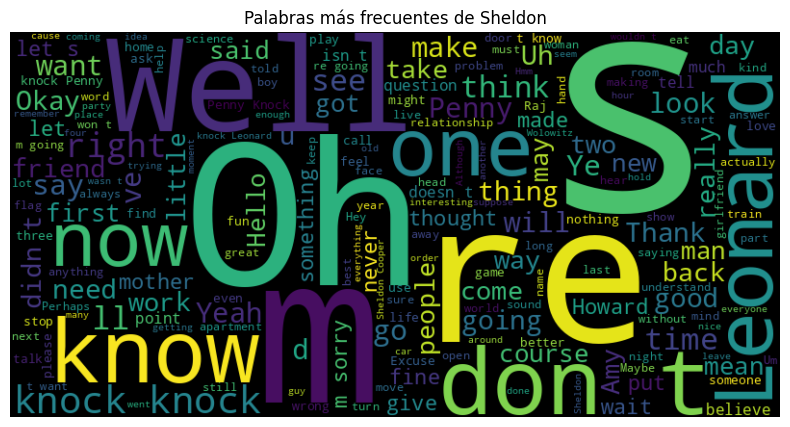

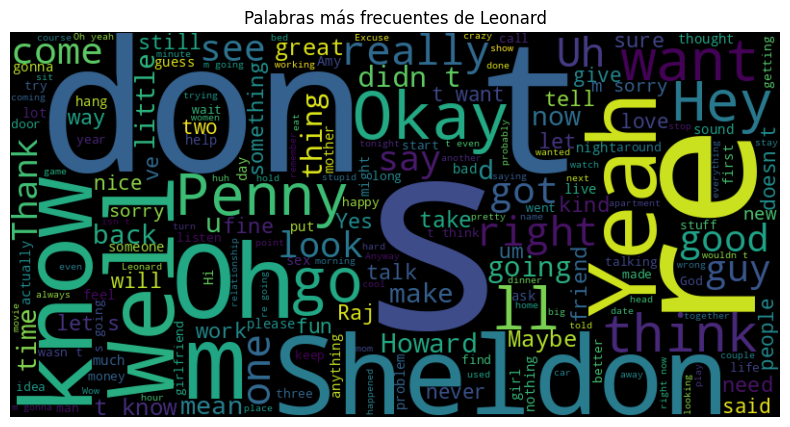

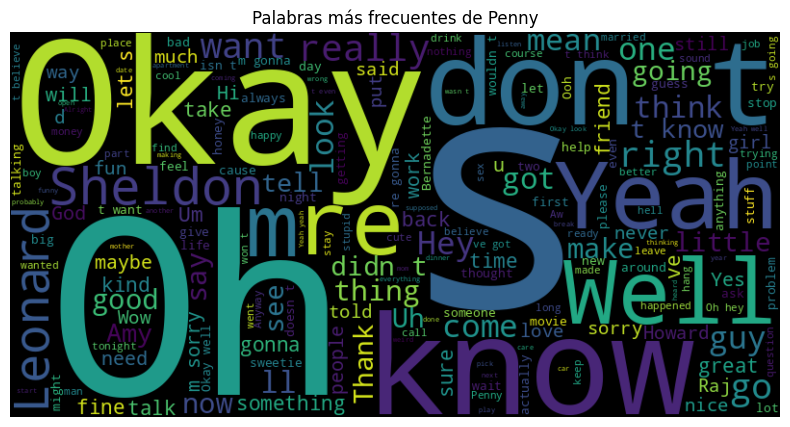

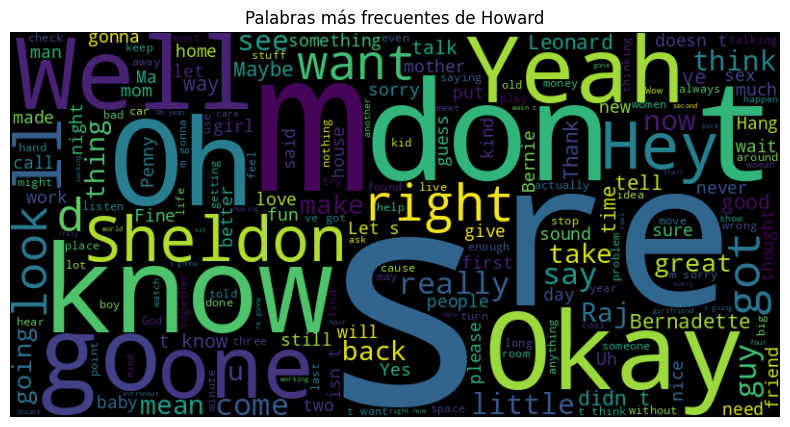

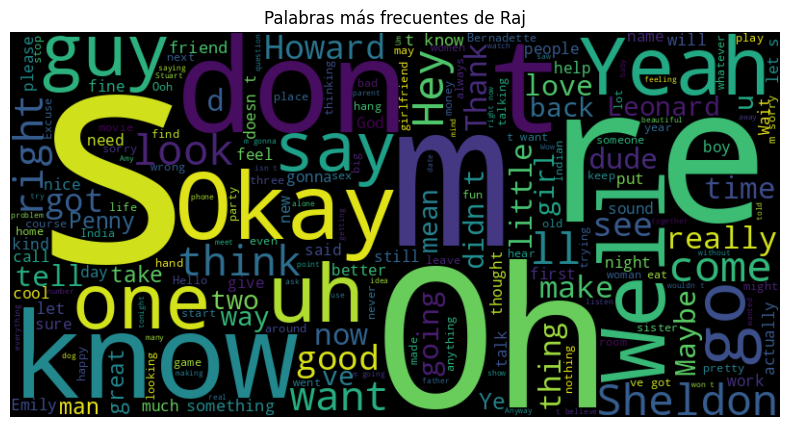

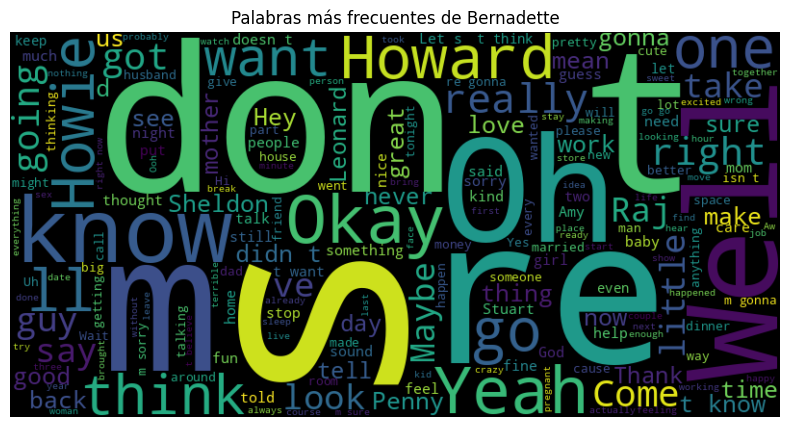

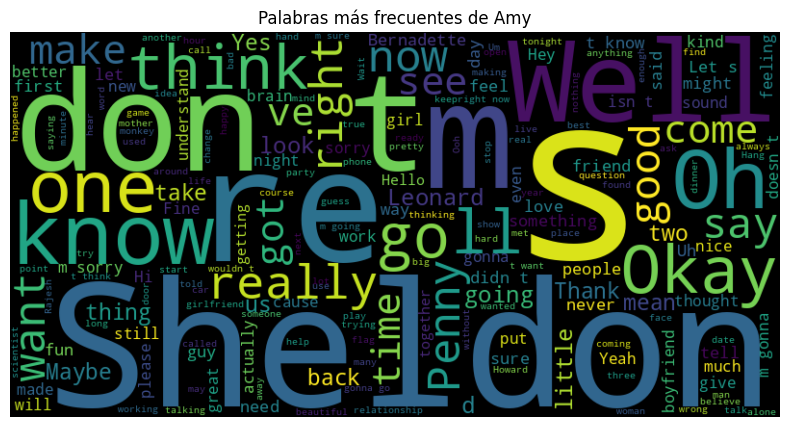

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

for person_group in personajes:
    # Filtrar diálogos del personaje
    person_df = filtered_df[filtered_df['person_group'] == person_group].copy()
    person_df = person_df.dropna(subset=['dialogue'])

    if not person_df.empty:
        # Tokenizar todos los diálogos del personaje
        all_dialogue = ' '.join(person_df['dialogue'].tolist()).lower()
        tokens = tokenizer.tokenize(all_dialogue)
        all_text = ' '.join(person_df['dialogue'].dropna().tolist())
        wc = WordCloud(width=800, height=400).generate(all_text)
        plt.figure(figsize=(10,5))
        plt.imshow(wc, interpolation='bilinear')
        plt.title(f'Palabras más frecuentes de {person_group}')
        plt.axis('off')
        plt.show()

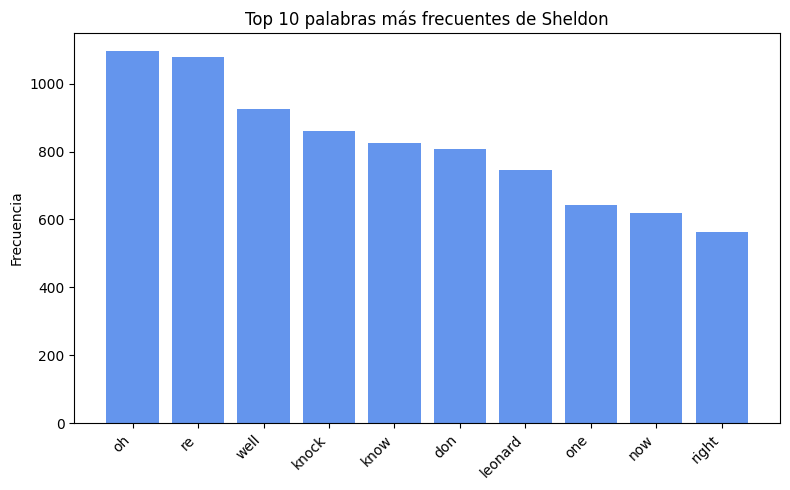

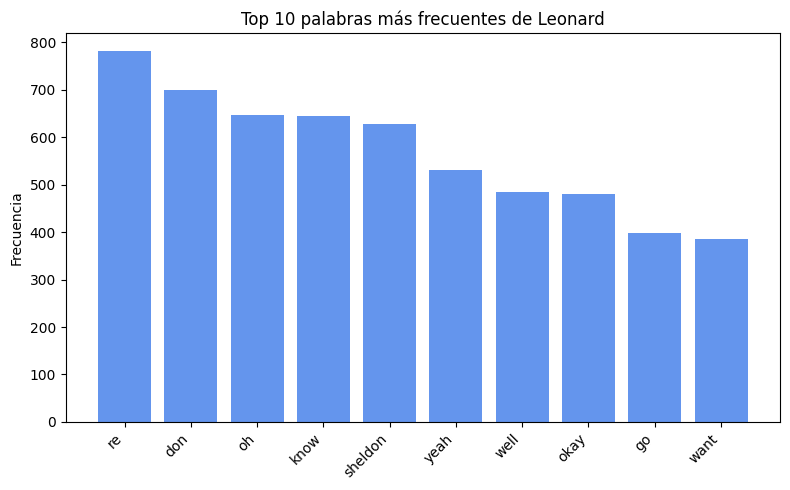

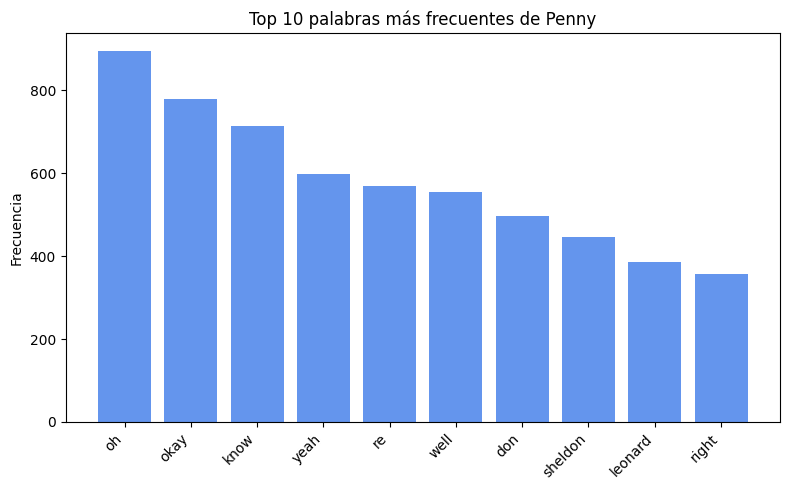

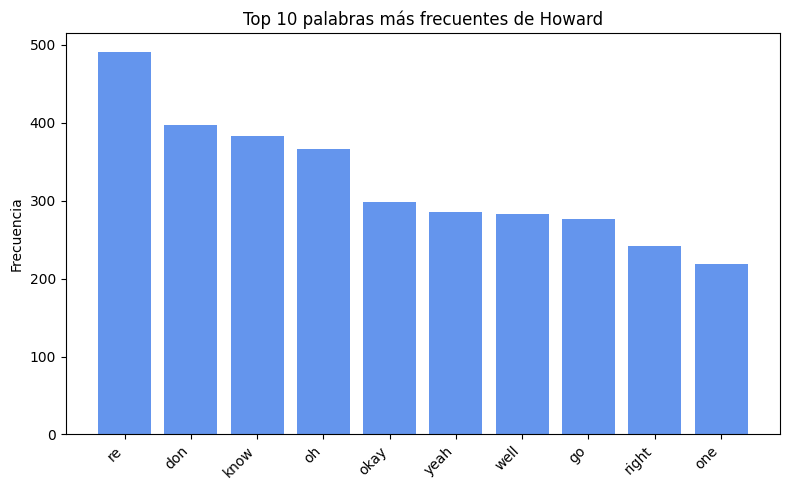

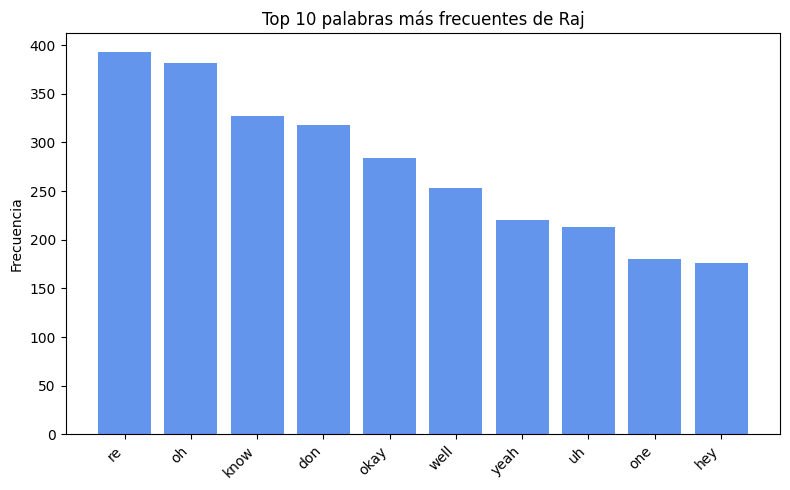

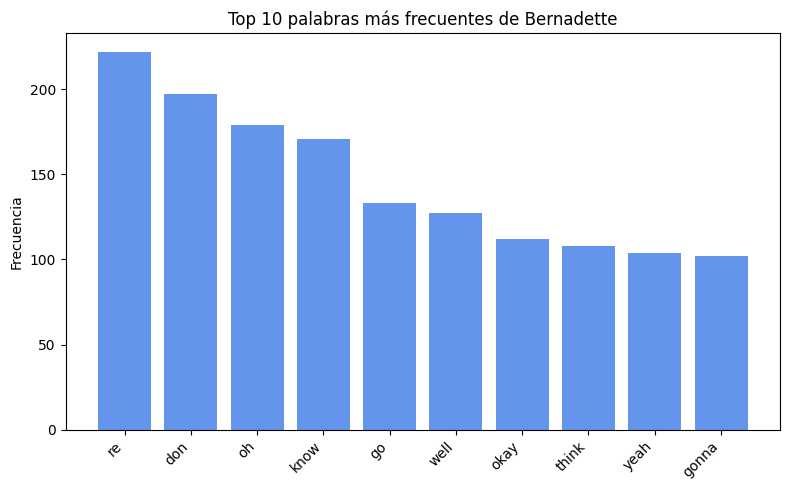

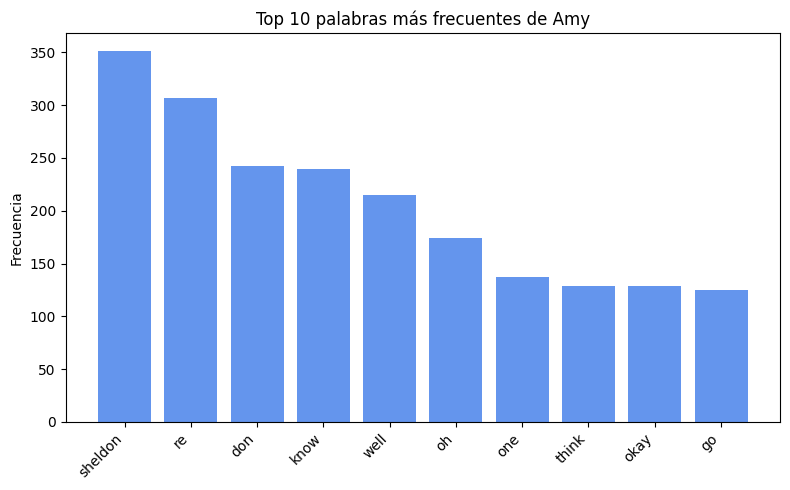

In [ ]:
import matplotlib.pyplot as plt
from nltk.tokenize import RegexpTokenizer
from collections import Counter
from wordcloud import STOPWORDS

# Excluir "Extra" si está en la lista
personajes = [p for p in filtered_df['person_group'].unique() if p != 'Extra']

# Tokenizador y stopwords
tokenizer = RegexpTokenizer(r'\w+')
stopwords = set(STOPWORDS)

for person_group in personajes:
    # Filtrar diálogos del personaje
    person_df = filtered_df[filtered_df['person_group'] == person_group].copy()
    person_df = person_df.dropna(subset=['dialogue'])

    if not person_df.empty:
        # Tokenizar y limpiar
        tokens = [
            token
            for text in person_df['dialogue']
            for token in tokenizer.tokenize(text.lower())
            if token.isalpha() and token not in stopwords and len(token) > 1
        ]

        # Contar frecuencias
        freq_dist = Counter(tokens)
        most_common = freq_dist.most_common(10)

        if most_common:
            words, counts = zip(*most_common)

            # Graficar
            plt.figure(figsize=(8, 5))
            plt.bar(words, counts, color='cornflowerblue')
            plt.xticks(rotation=45, ha='right')
            plt.ylabel('Frecuencia')
            plt.title(f'Top 10 palabras más frecuentes de {person_group}')
            plt.tight_layout()
            plt.show()
        else:
            print(f"No valid tokens found for {person_group}.")
    else:
        print(f"No dialogues found for {person_group} to analyze word frequency.")


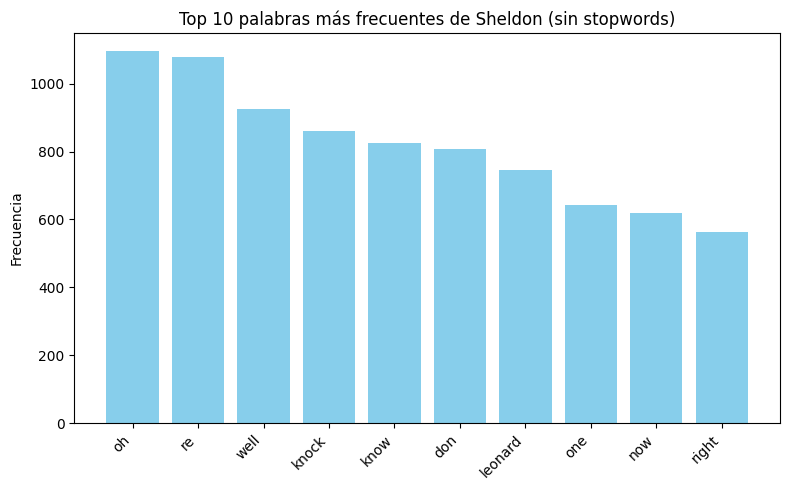

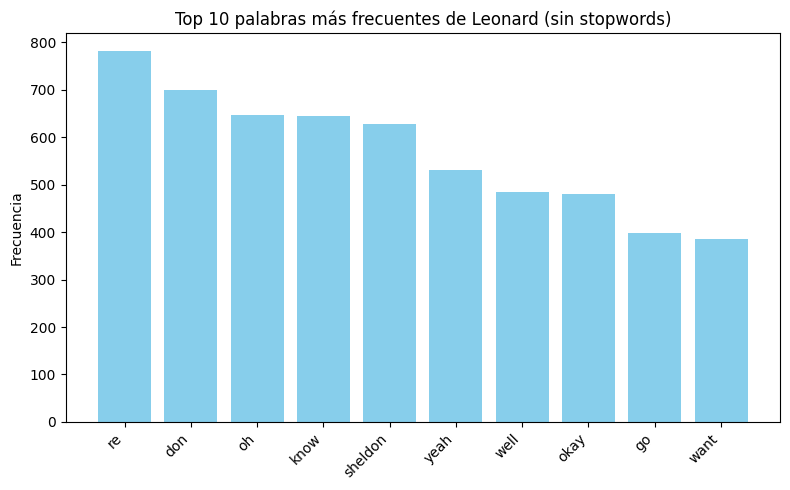

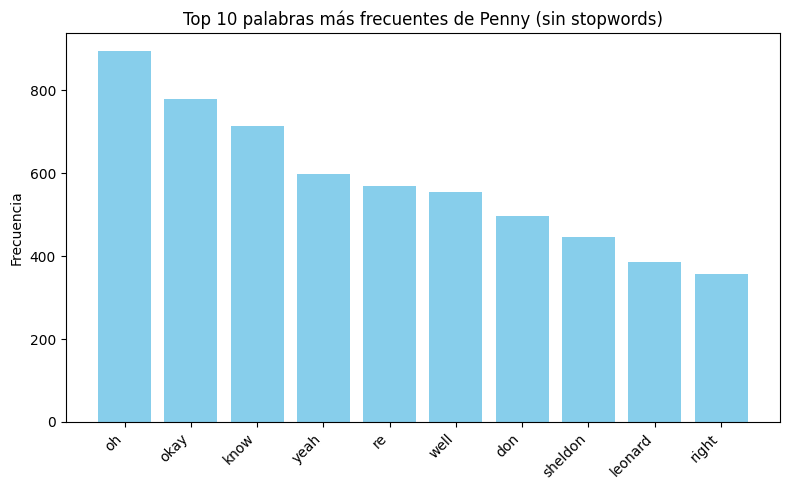

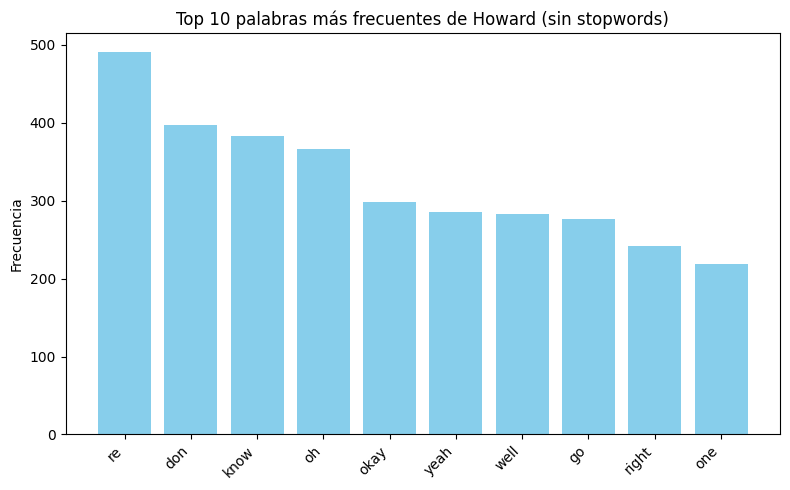

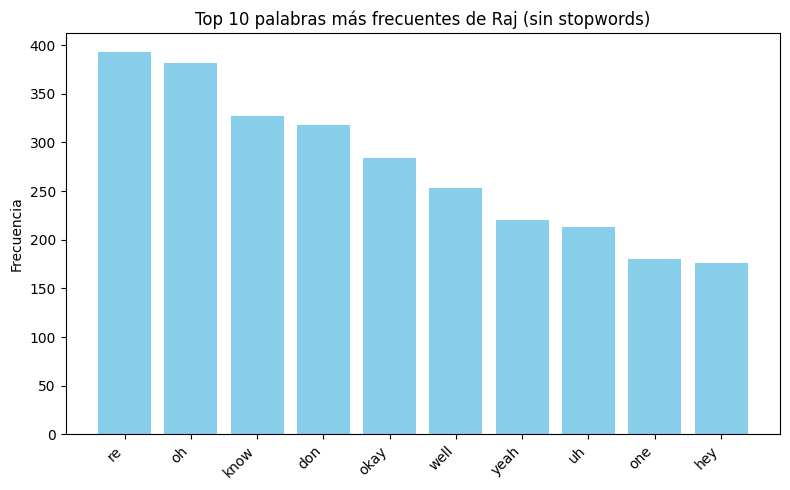

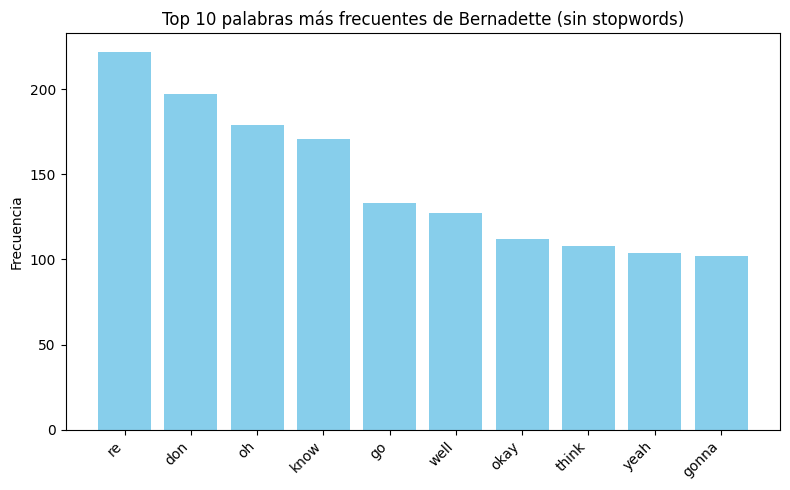

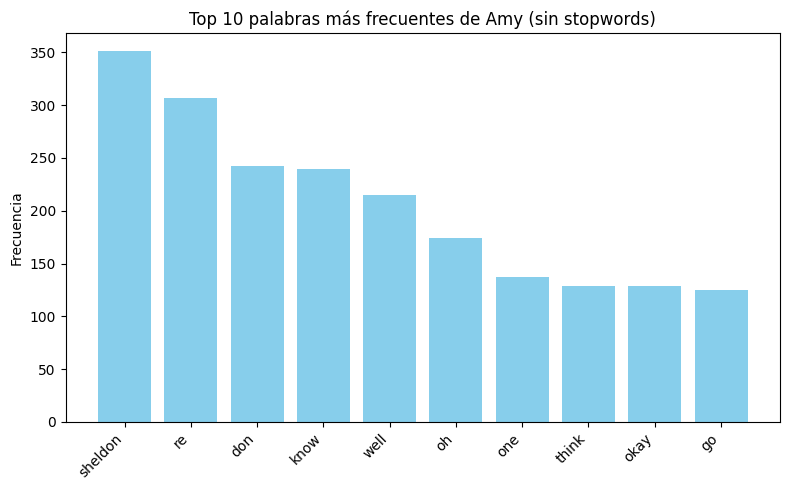

In [ ]:
import matplotlib.pyplot as plt
from nltk.tokenize import RegexpTokenizer
from collections import Counter
from wordcloud import STOPWORDS

# Lista de personajes principales, sin 'Extra'
personajes = [p for p in filtered_df['person_group'].unique() if p != 'Extra']

# Configuración del tokenizer y stopwords
tokenizer = RegexpTokenizer(r'\w+')
stopwords = set(STOPWORDS)

for person_group in personajes:
    # Filtrar diálogos del personaje
    person_df = filtered_df[filtered_df['person_group'] == person_group].copy()
    person_df = person_df.dropna(subset=['dialogue'])

    if not person_df.empty:
        # Tokenizar todos los diálogos del personaje
        all_dialogue = ' '.join(person_df['dialogue'].tolist()).lower()
        tokens = tokenizer.tokenize(all_dialogue)

        # Filtrar tokens: solo alfabéticos, no en stopwords, más de 1 letra
        filtered_tokens = [t for t in tokens if t.isalpha() and t not in stopwords and len(t) > 1]

        # Calcular frecuencia
        freq_dist = Counter(filtered_tokens)
        most_common = freq_dist.most_common(10)  # top 10

        # Separar palabras y frecuencias
        words, counts = zip(*most_common)

        # Crear gráfico
        plt.figure(figsize=(8, 5))
        plt.bar(words, counts, color='skyblue')
        plt.xticks(rotation=45, ha='right')
        plt.ylabel('Frecuencia')
        plt.title(f'Top 10 palabras más frecuentes de {person_group} (sin stopwords)')
        plt.tight_layout()
        plt.show()


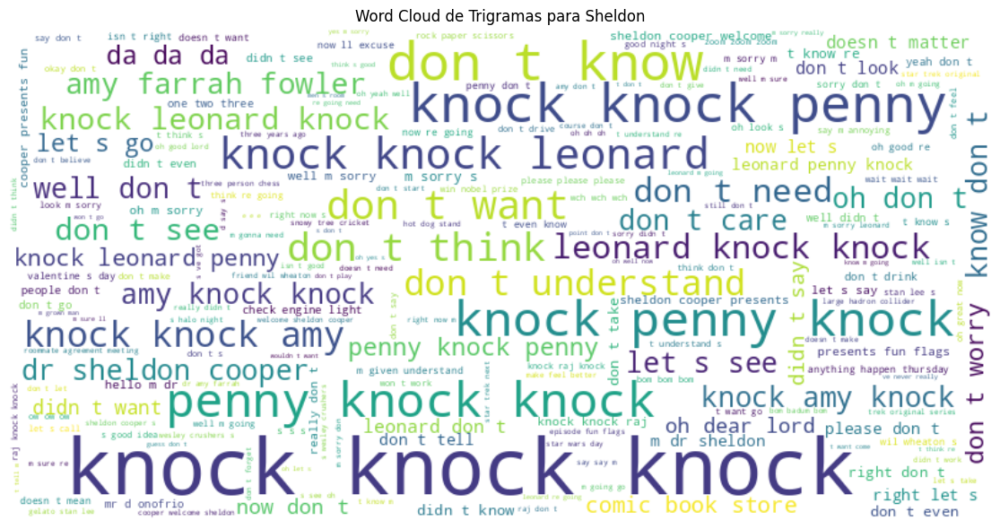

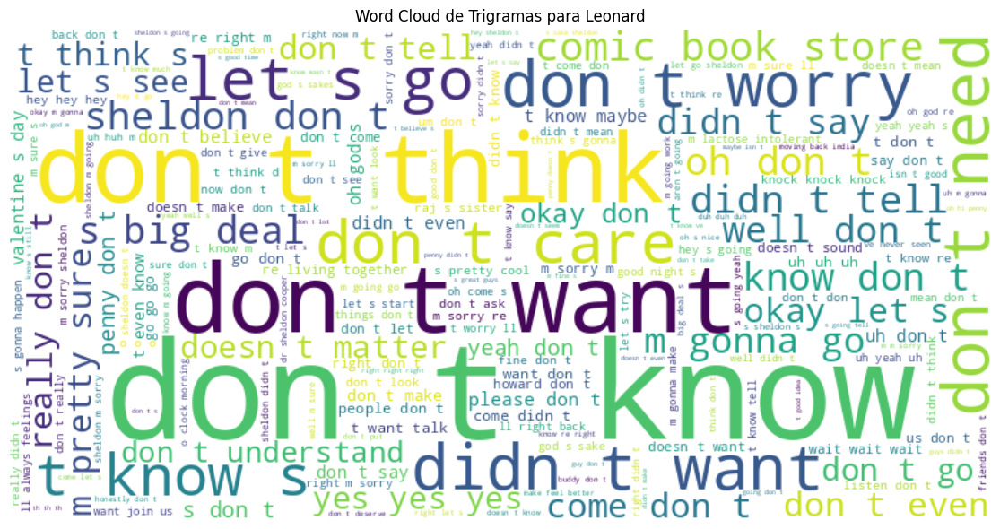

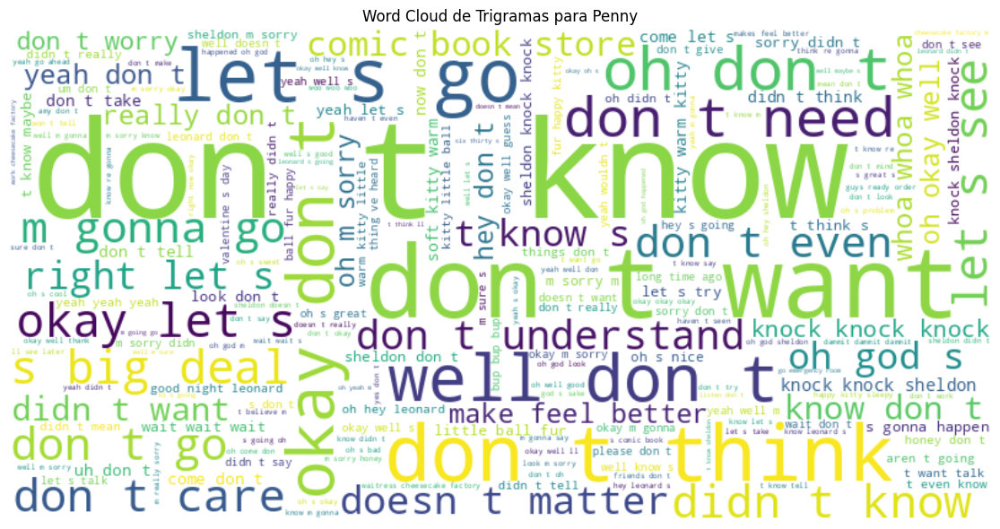

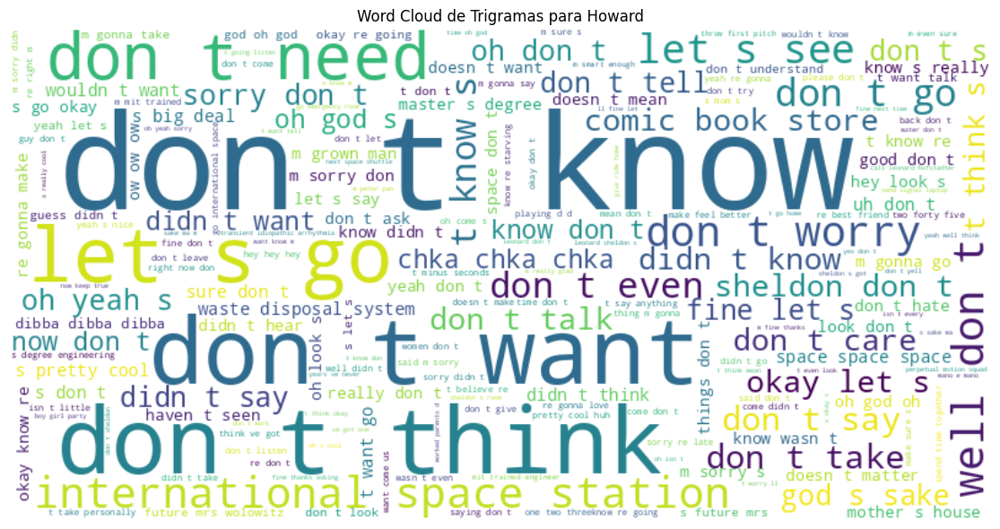

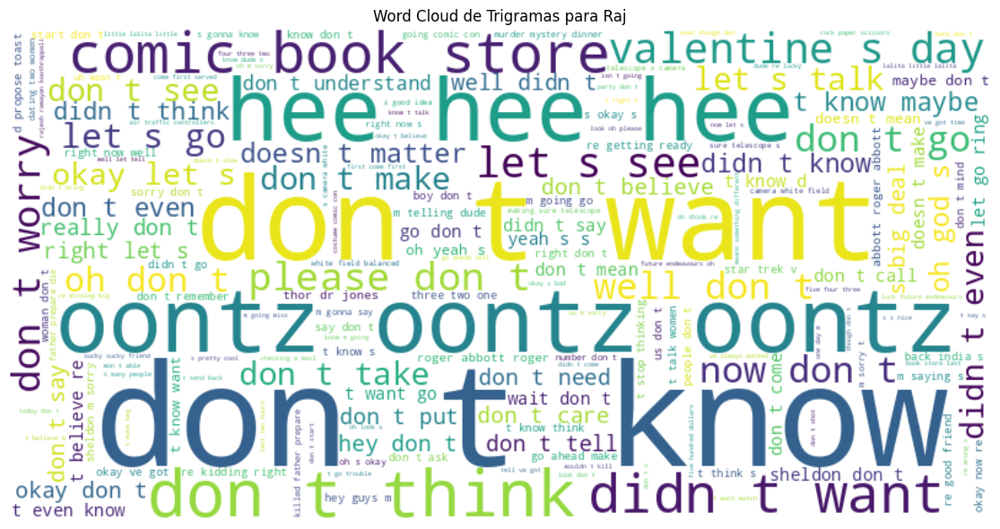

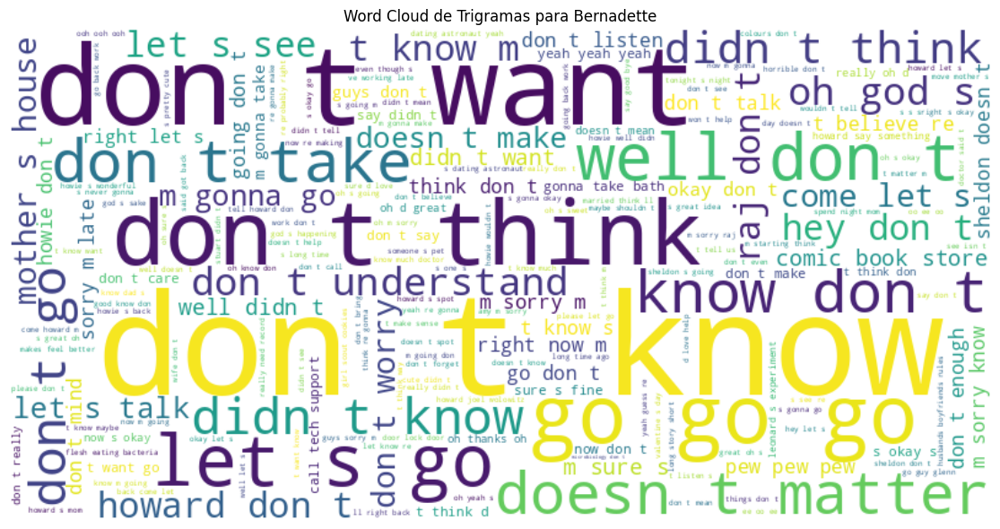

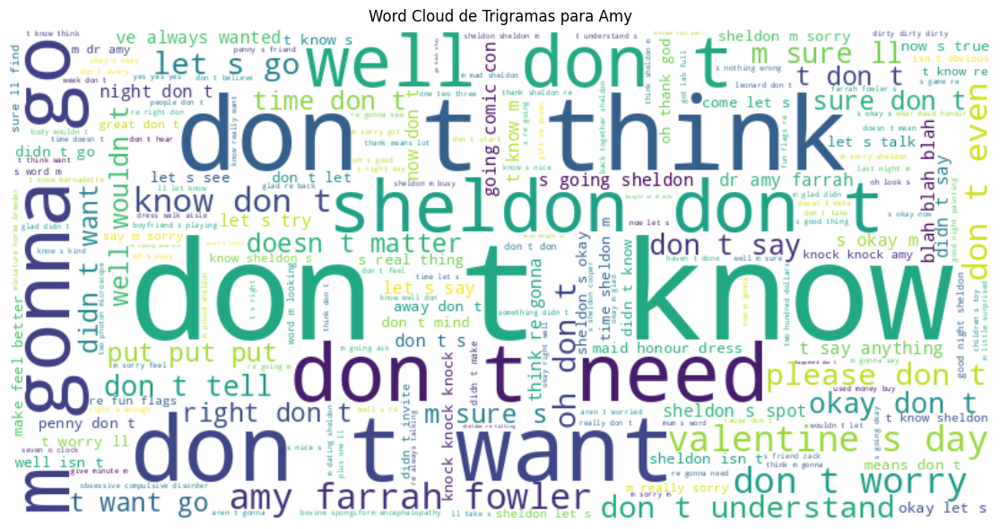

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
from nltk.tokenize import RegexpTokenizer
from nltk import ngrams
from collections import Counter

for person_group in personajes:
    # Filtrar diálogos del personaje
    person_df = filtered_df[filtered_df['person_group'] == person_group].copy()
    person_df = person_df.dropna(subset=['dialogue'])

    if not person_df.empty:
        # Tokenizar todos los diálogos del personaje, filtering non-alphabetic and stopwords
        tokenizer = RegexpTokenizer(r'\w+')
        stopwords = set(STOPWORDS)
        tokens = [
            token
            for text in person_df['dialogue'].dropna() # Use person_df and 'dialogue' column
            for token in tokenizer.tokenize(text.lower())
            if token.isalpha() and token not in stopwords
        ]

        # Calculate trigram frequencies
        trigram_freq = Counter(ngrams(tokens, 3))

        # Prepare data for word cloud
        ngram_freq = {}
        for (a, b, c), cnt in trigram_freq.items():
            ngram_freq[f"{a} {b} {c}"] = cnt

        # Generate word cloud from frequencies if ngram_freq is not empty
        if ngram_freq:
            wc = WordCloud(
                width=800,
                height=400,
                background_color="white"
            ).generate_from_frequencies(ngram_freq)

            # Plot the word cloud
            plt.figure(figsize=(12, 6))
            plt.imshow(wc, interpolation='bilinear')
            plt.axis('off')
            plt.title(f'Word Cloud de Trigramas para {person_group}') # Added person_group to title
            plt.tight_layout()
            plt.show()
        else:
            print(f"No trigrams found for {person_group} to generate word cloud.")
    else:
        print(f"No dialogues found for {person_group} to analyze trigram frequency.")

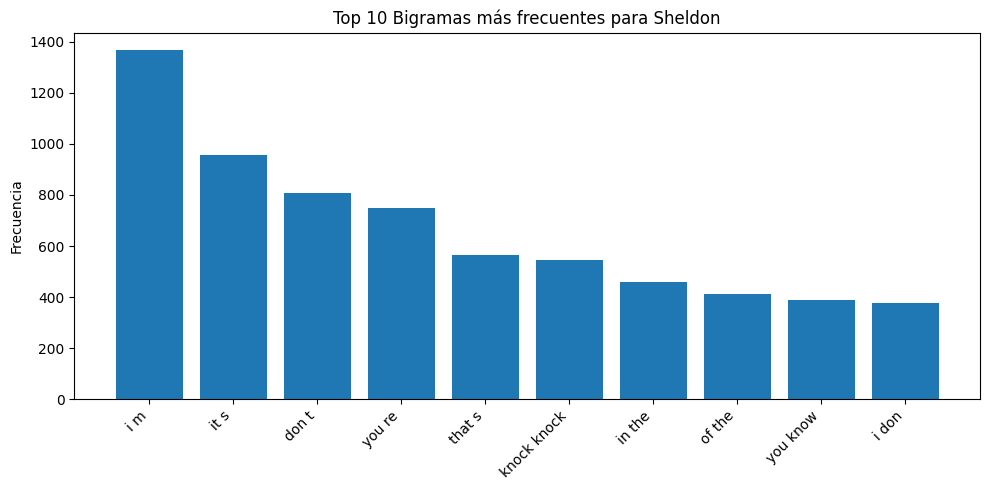

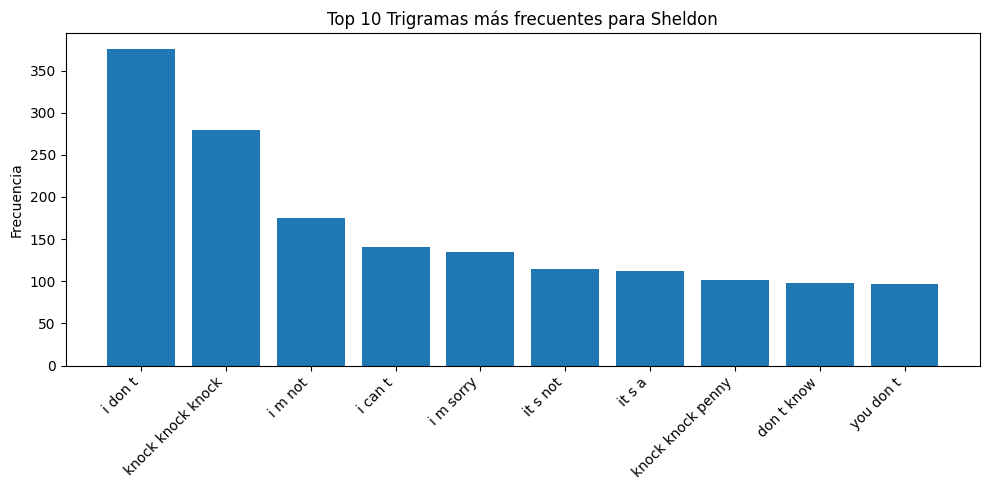

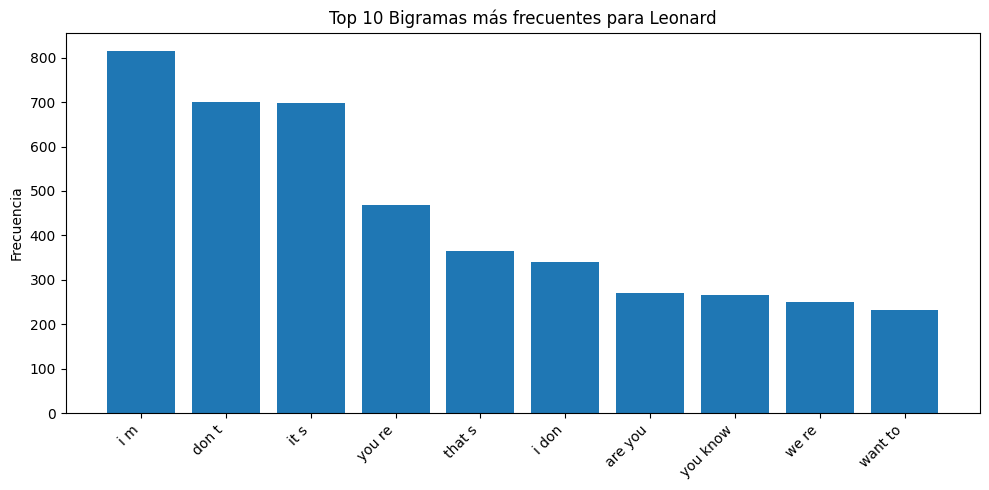

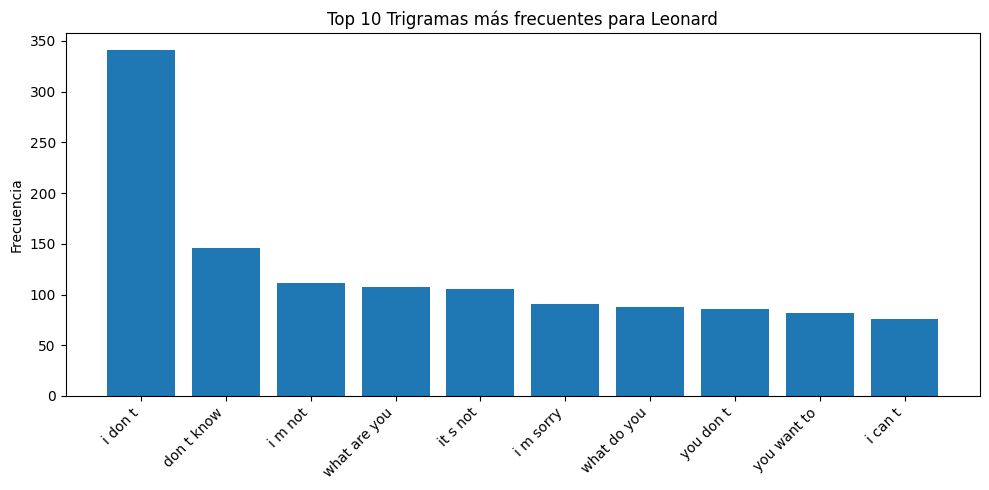

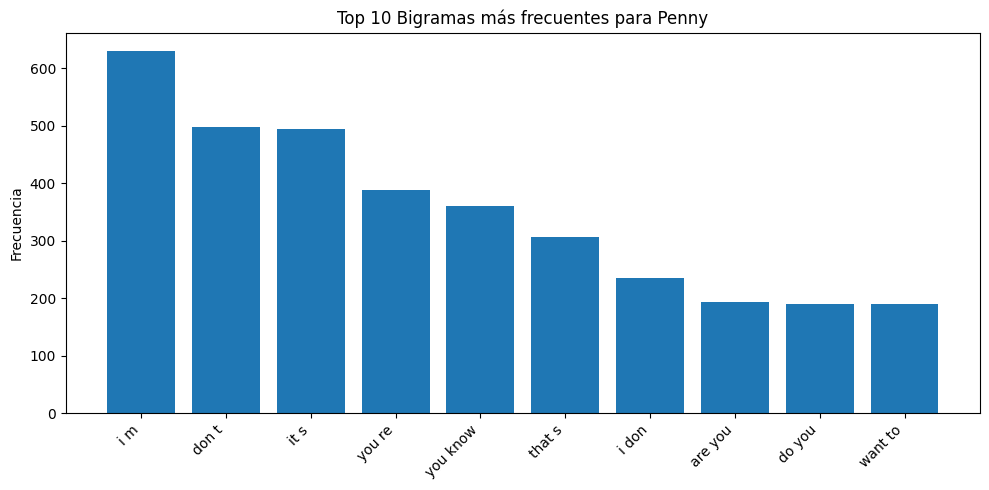

...

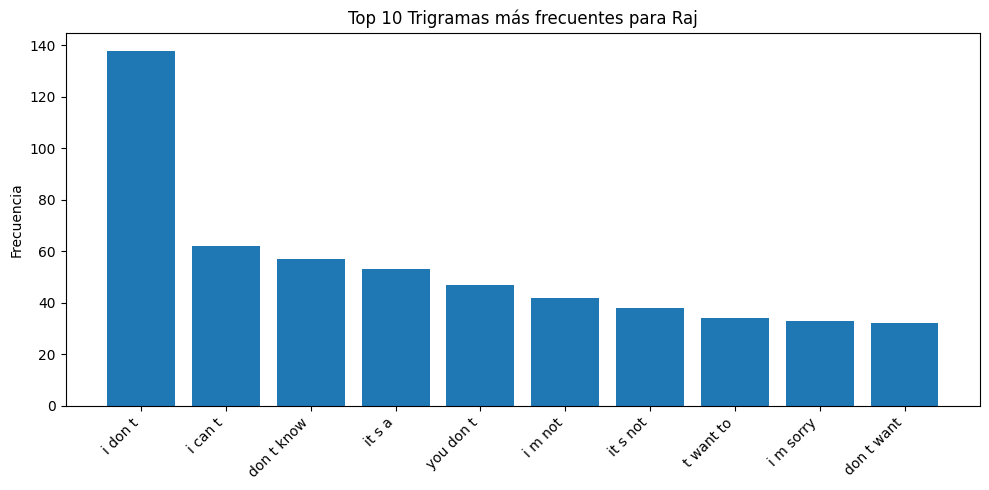

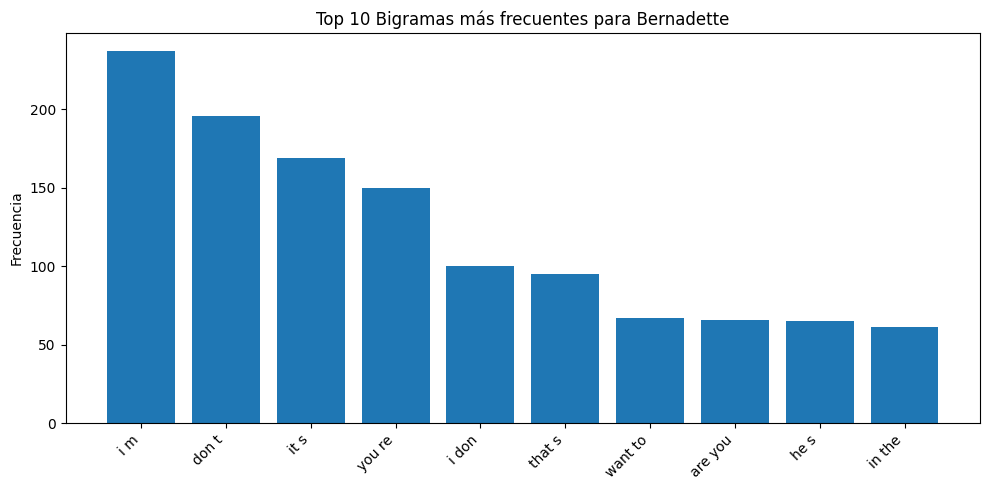

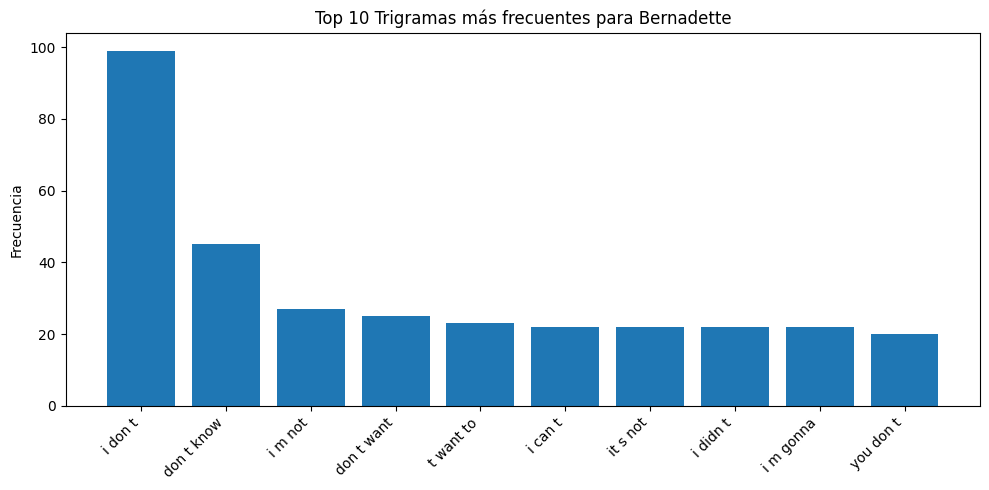

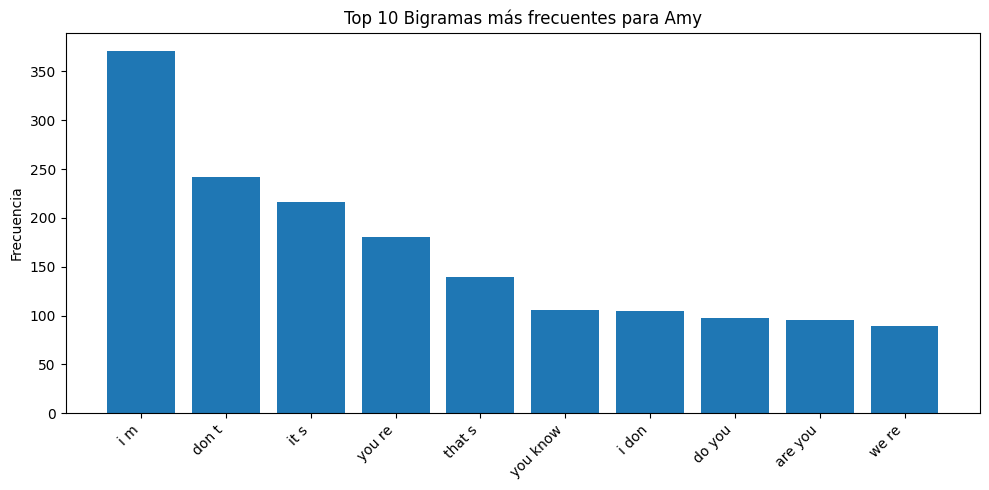

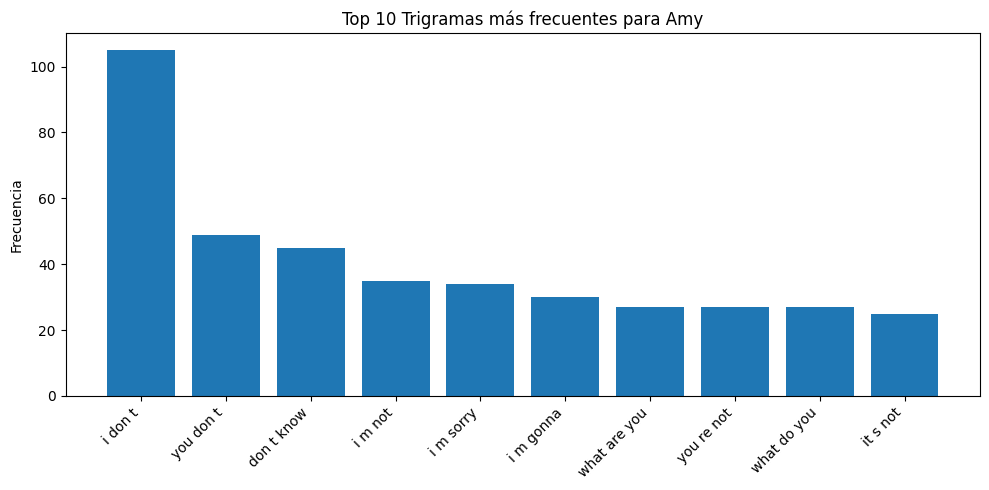

In [ ]:
import matplotlib.pyplot as plt
from nltk.tokenize import RegexpTokenizer
from nltk import ngrams
from collections import Counter

for person_group in personajes:
    # Filtrar diálogos del personaje
    person_df = filtered_df[filtered_df['person_group'] == person_group].copy()
    person_df = person_df.dropna(subset=['dialogue'])

    if not person_df.empty:
        tokenizer = RegexpTokenizer(r'\w+')
        # Tokenize dialogues only for the current person_group
        tokens = [
            token
            for text in person_df['dialogue'].dropna()
            for token in tokenizer.tokenize(text.lower())
        ]

        # Corrected indentation for N-gram calculation and plotting
        bigrams = list(ngrams(tokens, 2))
        trigrams = list(ngrams(tokens, 3))

        bigram_freq = Counter(bigrams).most_common(10)
        trigram_freq = Counter(trigrams).most_common(10)

        # Plot Bigrams if available
        if bigram_freq:
            bigram_labels, bigram_counts = zip(*[(f"{a} {b}", c) for (a, b), c in bigram_freq])
            plt.figure(figsize=(10, 5)) # Adjusted figure size for better readability
            plt.bar(bigram_labels, bigram_counts)
            plt.xticks(rotation=45, ha='right')
            plt.ylabel('Frecuencia')
            plt.title(f'Top 10 Bigramas más frecuentes para {person_group}') # Added person_group to title
            plt.tight_layout()
            plt.show()
        else:
            print(f"No bigrams found for {person_group}.")

        # Plot Trigrams if available
        if trigram_freq:
            trigram_labels, trigram_counts = zip(*[(f"{a} {b} {c}", cnt) for (a, b, c), cnt in trigram_freq])
            plt.figure(figsize=(10, 5)) # Adjusted figure size for better readability
            plt.bar(trigram_labels, trigram_counts)
            plt.xticks(rotation=45, ha='right')
            plt.ylabel('Frecuencia')
            plt.title(f'Top 10 Trigramas más frecuentes para {person_group}') # Added person_group to title
            plt.tight_layout()
            plt.show()
        else:
            print(f"No trigrams found for {person_group}.")

    else:
        print(f"No dialogues found for {person_group} to analyze N-grams.")